In [18]:
import numpy as np
import os
import matplotlib.pyplot as plt
import sklearn
import umap.umap_ as umap
import pandas as pd
import seaborn as sns
from tqdm import tqdm_notebook
# for classifcator 
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score

In [19]:
path = '/home/rfit/Telescope_Array/phd_work/src/BERT/augmentation_research/info_Transfoemr_MMD_0.05_KL_0.01_new_MMDITERATE'
all_emb = {}
for part in os.listdir(path):
    all_emb[part] = {}
    for f in os.listdir(path + '/' + part):
        file = path + '/' + part + '/' + f
        n = f.split('_')[-1].replace('.npy', '')
        n=int(n)
        all_emb[part][n] = np.load(file)

In [20]:
print(all_emb.keys())
print(all_emb['proton'].keys())

print(all_emb['photon'].keys())
print(all_emb['proton'][0].shape)

dict_keys(['proton', 'photon'])
dict_keys([14, 5, 15, 11, 19, 3, 16, 17, 2, 0, 18, 12, 6, 1, 7, 10, 20, 8, 4, 13, 9])
dict_keys([14, 5, 15, 11, 19, 3, 16, 17, 2, 0, 18, 12, 6, 1, 7, 10, 20, 8, 4, 13, 9])
(779042, 8)


In [21]:
proton_emb = all_emb['proton'][0]
photon_emb = all_emb['photon'][0]

print('proton num:', proton_emb.shape[0])
print('photon num:', photon_emb.shape[0])
part = photon_emb.shape[0]/proton_emb.shape[0]
# unneeded vector
y = np.zeros(proton_emb.shape[0])
# Разделение на тренировочную и тестовую выборки
X_train, X_test, _, _ = train_test_split(
    proton_emb, y, 
    test_size=part, 
    stratify=y,
    random_state=42
)
print('X_train num:', X_train.shape[0])
print('X_test num:', X_test.shape[0])


proton num: 779042
photon num: 364419
X_train num: 414623
X_test num: 364419


Плотность в точке: [0.00783295]


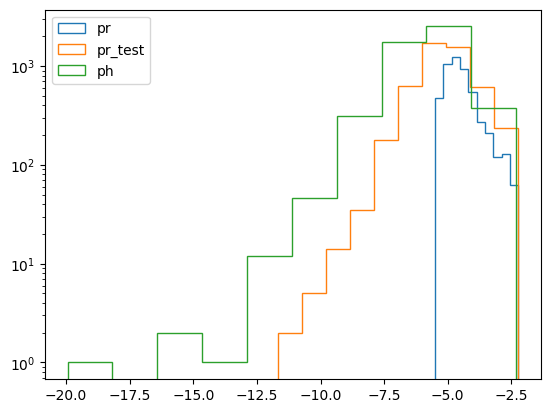

In [22]:
kde = stats.gaussian_kde(proton_emb[:5000].T)  # Ожидает данные в форме (m, n)

# Оценка плотности в точке, например, в (0, 0)
point = np.array(X_test[0])
density = kde(point)
print(f"Плотность в точке: {density}")
density_pr = kde.logpdf(proton_emb[:5000].T)
density_pr_test = kde.logpdf(proton_emb[-5000:].T)
density_ph = kde.logpdf(photon_emb[:5000].T)
plt.hist(density_pr, histtype = 'step', log=True, label = 'pr')
plt.hist(density_pr_test, histtype = 'step', log=True, label = 'pr_test')
plt.hist(density_ph, histtype = 'step', log=True, label = 'ph')
plt.legend()

In [23]:
threshold = -5.5
print(np.sum(density_pr<threshold)/len(density_pr))
print(np.sum(density_ph<threshold)/len(density_ph))

0.0006
0.5442


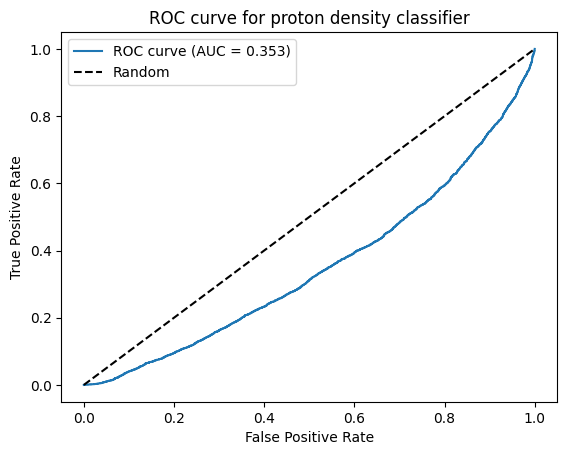

AUC = 0.3526
0.5827800385521525
recall: 0.5442, pressision: 0.6272


In [25]:

scores = np.concatenate([density_pr_test, density_ph])
true_labels = np.concatenate([np.zeros_like(density_pr), np.ones_like(density_ph)])



# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(true_labels, scores)
auc = roc_auc_score(true_labels, scores)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.3f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for proton density classifier')
plt.legend()
plt.show()

print(f'AUC = {auc:.4f}')
print(f1_score(true_labels, scores<threshold))
recall = recall_score(true_labels, scores<threshold)
pressision = precision_score(true_labels, scores<threshold)

print(f'recall: {recall:.4f}, pressision: {pressision:.4f}')


Плотность в точке: [0.01001933]


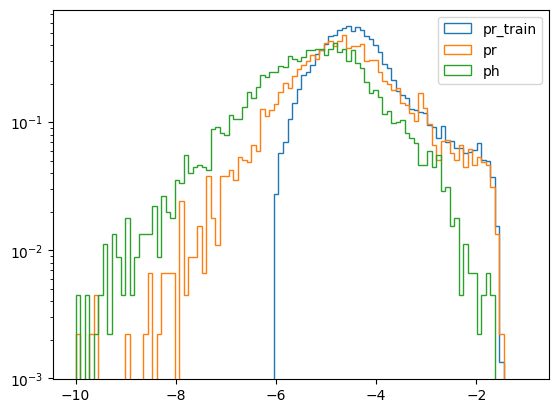

In [26]:
proton_st = all_emb['proton'][0][:25000]
photon_st = all_emb['photon'][0][:5000]

all_st= np.concatenate([proton_st, photon_st], axis=0) 
kde = stats.gaussian_kde(proton_st.T)  # Ожидает данные в форме (m, n)

# Оценка плотности в точке, например, в (0, 0)
point = np.array(X_test[0])
density = kde(point)
print(f"Плотность в точке: {density}")

density_pr_train = kde.logpdf(proton_st.T)
density_pr = kde.logpdf(all_emb['proton'][0][-5000:].T)
density_ph = kde.logpdf(photon_st.T)
plt.hist(density_pr_train, histtype = 'step', log=True, label = 'pr_train', density=True, bins=100, range=(-10, -1))
plt.hist(density_pr, histtype = 'step', log=True, label = 'pr', density=True, bins=100, range=(-10, -1))
plt.hist(density_ph, histtype = 'step', log=True, label = 'ph', density=True, bins=100, range=(-10, -1))
plt.legend()

Плотность в точке: [0.00811365]


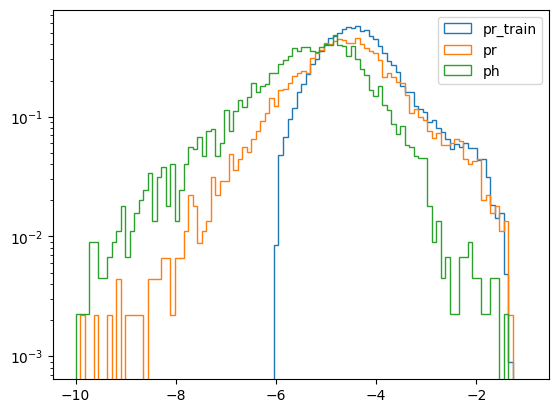

In [83]:
proton_st = all_emb['proton'][0][:25000]
photon_st = all_emb['photon'][0][:5000]

all_st= np.concatenate([proton_st, photon_st], axis=0) 
kde = stats.gaussian_kde(proton_st.T)  # Ожидает данные в форме (m, n)

# Оценка плотности в точке, например, в (0, 0)
point = np.array(X_test[0])
density = kde(point)
print(f"Плотность в точке: {density}")

density_pr_train = kde.logpdf(proton_st.T)
density_pr = kde.logpdf(all_emb['proton'][0][-5000:].T)
density_ph = kde.logpdf(photon_st.T)
plt.hist(density_pr_train, histtype = 'step', log=True, label = 'pr_train', density=True, bins=100, range=(-10, -1))
plt.hist(density_pr, histtype = 'step', log=True, label = 'pr', density=True, bins=100, range=(-10, -1))
plt.hist(density_ph, histtype = 'step', log=True, label = 'ph', density=True, bins=100, range=(-10, -1))
plt.legend()

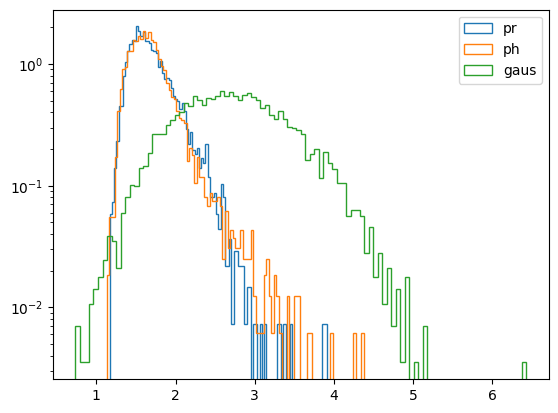

In [16]:
import torch
rad_pr = np.sqrt(np.sum(proton_st**2, axis=1))
rad_ph = np.sqrt(np.sum(photon_st**2, axis=1))
gaus = torch.randn_like(torch.tensor(proton_st)).numpy()
gaus_R = np.sqrt(np.sum(gaus**2, axis=1))
plt.hist(rad_pr, histtype = 'step', log=True, label = 'pr', density=True, bins=100)
plt.hist(rad_ph, histtype = 'step', log=True, label = 'ph', density=True, bins=100)
plt.hist(gaus_R, histtype = 'step', log=True, label = 'gaus', density=True, bins=100)
plt.legend()


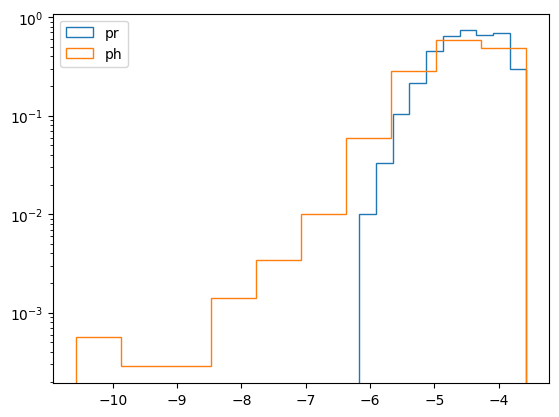

In [28]:
proton_st = all_emb['proton'][0][:5000]
photon_st = all_emb['photon'][0][:5000]

all_st= np.concatenate([proton_st, photon_st], axis=0) 

reducer = umap.UMAP(n_components=4)
manifold = reducer.fit(proton_st)
X_pr = manifold.transform(proton_st)
X_ph = manifold.transform(photon_st)
X_pr_test = manifold.transform(proton_st[-5000:])
X_reduced = manifold.transform(all_st)


kde = stats.gaussian_kde(X_pr.T)  # Ожидает данные в форме (m, n)


density_pr = kde.logpdf(X_pr_test[:].T)
density_ph = kde.logpdf(X_ph[:].T)
plt.hist(density_pr, histtype = 'step', log=True, label = 'pr', density=True)
plt.hist(density_ph, histtype = 'step', log=True, label = 'ph', density=True)
plt.legend()

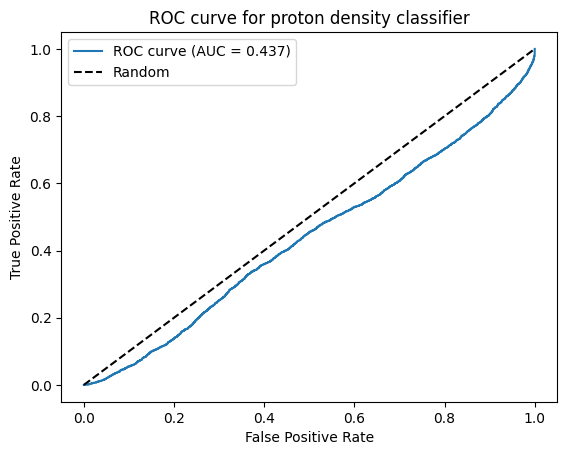

AUC = 0.4373


In [29]:
# Combine scores and create true labels
scores = np.concatenate([density_pr, density_ph])
true_labels = np.concatenate([np.zeros_like(density_pr), np.ones_like(density_ph)])

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(true_labels, scores)
auc = roc_auc_score(true_labels, scores)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.3f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for proton density classifier')
plt.legend()
plt.show()

print(f'AUC = {auc:.4f}')

f1: 0.6560, pressision: 0.5512, recall: 0.8102


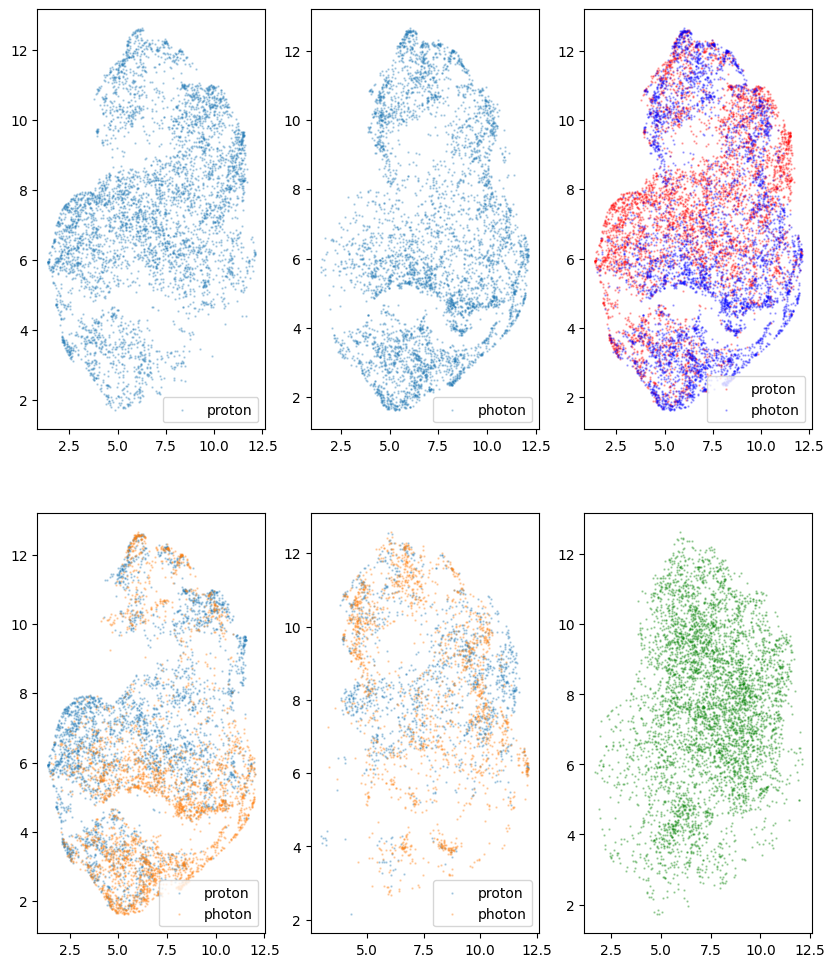

In [17]:
from sklearn.metrics import f1_score, precision_score, recall_score
num_iter = len(all_emb['proton'].keys())
num_iter = 2
threshold = -4.72
fig, axs = plt.subplots(num_iter,3, figsize=(10,6*num_iter))

ax_row = axs[0]
proton_st = all_emb['proton'][0][:5000]
photon_st = all_emb['photon'][0][:5000]

all_st= np.concatenate([proton_st, photon_st, gaus], axis=0) 
reducer = umap.UMAP(n_components=2)
manifold = reducer.fit(all_st)
X_pr = manifold.transform(proton_st)
X_ph = manifold.transform(photon_st)
X_reduced = manifold.transform(all_st)
X_gaus = manifold.transform(gaus)
names = ['proton', 'photon']
# ax.scatter(X_reduced[:, 0], X_reduced[:, 1], c=lable, cmap='viridis', alpha=0.7, label=names)
# ax.legend()
if not(ax_row is None):
    ax_1,ax_2, ax_3  = ax_row
    ax_1.scatter(X_pr[:, 0], X_pr[:, 1], s=0.5, alpha=0.3, label=names[0])
    ax_2.scatter(X_ph[:, 0], X_ph[:, 1], s=0.5, alpha=0.3, label=names[1])
    ax2 = (ax_1,ax_2)
    ax_1.legend()
    ax_2.legend()
    ax_3.scatter(X_pr[:, 0], X_pr[:, 1], s=0.5, alpha=0.3, label=names[0], color = 'r')
    ax_3.scatter(X_ph[:, 0], X_ph[:, 1], s=0.5, alpha=0.3, label=names[1], color = 'b')
    ax_3.legend()

    # ax_2.set_title(f'UMAP: inreration {i}')


ax_row =axs[1]
ax_1,ax_2, ax_3  = ax_row
X_pr_pr = X_pr[density_pr > threshold]
X_ph_pr = X_ph[density_ph > threshold]

ax_1.scatter(X_pr_pr[:, 0], X_pr_pr[:, 1], s=0.5, alpha=0.3, label=names[0])
ax_1.scatter(X_ph_pr[:, 0], X_ph_pr[:, 1], s=0.5, alpha=0.3, label=names[1])
ax_1.legend()

X_pr_ph = X_pr[density_pr < threshold]
X_ph_ph = X_ph[density_ph < threshold]
ax_2.scatter(X_pr_ph[:, 0], X_pr_ph[:, 1], s=0.5, alpha=0.3, label=names[0])
ax_2.scatter(X_ph_ph[:, 0], X_ph_ph[:, 1], s=0.5, alpha=0.3, label=names[1])
ax_2.legend()


ax_3.scatter(X_gaus[:, 0], X_gaus[:, 1], s=0.5, alpha=0.3, label=names[0], color = 'g')

f1 = f1_score(true_labels, scores<threshold)
pressision = precision_score(true_labels, scores<threshold)
recall = recall_score(true_labels, scores<threshold)

print(f'f1: {f1:.4f}, pressision: {pressision:.4f}, recall: {recall:.4f}')




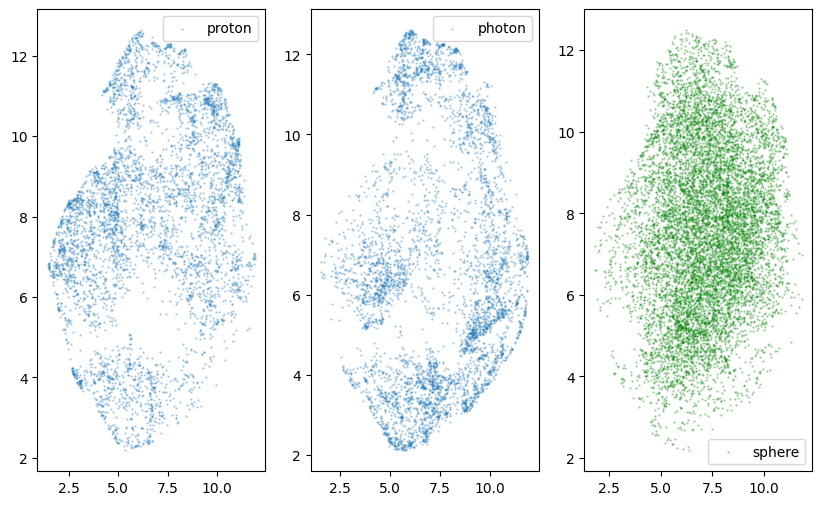

In [15]:
ones_sphere = np.random.randn(10000, 8)

all_st= np.concatenate([proton_st, photon_st, ones_sphere], axis=0) 
reducer = umap.UMAP(n_components=2)
manifold = reducer.fit(all_st)
X_pr = manifold.transform(proton_st)
X_ph = manifold.transform(photon_st)
X_reduced = manifold.transform(all_st)
names = ['proton', 'photon']
fig, axs = plt.subplots(1,3, figsize=(10,6*1))
X_pr = manifold.transform(proton_st)
X_ph = manifold.transform(photon_st)
X_reduced = manifold.transform(all_st)
sphere = manifold.transform(ones_sphere)
names = ['proton', 'photon']
# ax.scatter(X_reduced[:, 0], X_reduced[:, 1], c=lable, cmap='viridis', alpha=0.7, label=names)
# ax.legend()
ax_1,ax_2, ax_3  = axs
ax_1.scatter(X_pr[:, 0], X_pr[:, 1], s=0.5, alpha=0.3, label=names[0])
ax_2.scatter(X_ph[:, 0], X_ph[:, 1], s=0.5, alpha=0.3, label=names[1])
ax2 = (ax_1,ax_2)
ax_1.legend()
ax_2.legend()
# ax_3.scatter(X_pr[:, 0], X_pr[:, 1], s=0.5, alpha=0.3, label=names[0], color = 'r')
# ax_3.scatter(X_ph[:, 0], X_ph[:, 1], s=0.5, alpha=0.3, label=names[1], color = 'b')
ax_3.scatter(sphere[:, 0], sphere[:, 1], s=0.5, alpha=0.3, label='sphere', color = 'g')
ax_3.legend()

# ax_2.set_title(f'UMAP: inreration {i}')


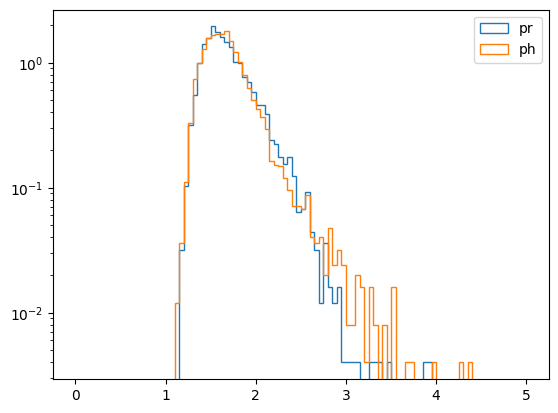

In [ ]:
ones_sphere = np.random.randn(10000, 8)
rad_pr = np.sqrt(np.sum(proton_st**2, axis=1))
rad_ph = np.sqrt(np.sum(photon_st**2, axis=1))
rad_ones = np.sqrt(np.sum(ones_sphere**2, axis=1))
plt.hist(rad_pr, histtype = 'step', log=True, label = 'pr', density=True, bins=100)
plt.hist(rad_ph, histtype = 'step', log=True, label = 'ph', density=True, bins=100)
# plt.hist(rad_ones, histtype = 'step', log=True, label = 'ones', density=True, range=(0, 5), bins=100)
plt.legend()



/tmp/ipykernel_19605/3314903882.py:8: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

Best F1: 0.9389 at threshold: -4.7273
Best pressision: 0.6053, Best recall: 0.6974


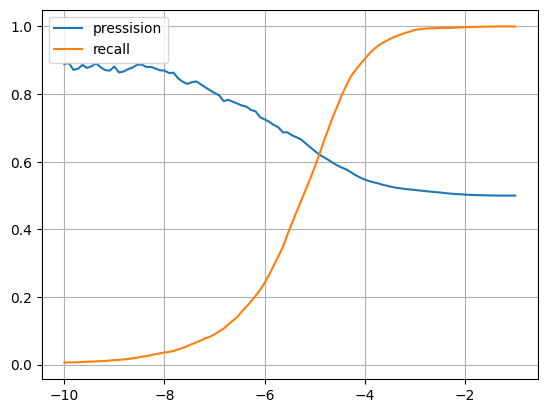

In [92]:
best_f1 = -1
best_th = -1
best_pressision = -1
best_recall = -1
recall_list = []
pressision_list = []
th_list = []
for th in tqdm_notebook(np.linspace(-10, -1, 100)):
    pressision = precision_score(true_labels, scores<th)
    recall = recall_score(true_labels, scores<th)
    f1 = 2*pressision*3*recall/(pressision+3*recall)
    pressision_list.append(pressision)
    recall_list.append(recall)

    th_list.append(th)
    if f1 > best_f1:
        best_f1 = f1
        best_th = th
        best_pressision = pressision
        best_recall = recall    
print(f'Best F1: {best_f1:.4f} at threshold: {best_th:.4f}')
print(f'Best pressision: {best_pressision:.4f}, Best recall: {best_recall:.4f}')
plt.plot(th_list, pressision_list, label = 'pressision')
plt.plot(th_list, recall_list, label = 'recall')
plt.grid()
plt.legend()


In [ ]:
kde = stats.gaussian_kde(X_pr.T)  # Ожидает данные в форме (m, n)

# Оценка плотности в точке, например, в (0, 0)
point = np.array((6,0))
density = kde(point)
print(f"Плотность в точке: {density}")
density_pr = kde.logpdf(X_pr[:1000].T)
density_ph = kde.logpdf(X_ph[:1000].T)
plt.hist(density_pr, histtype = 'step', log=True, label = 'py')
plt.hist(density_ph, histtype = 'step', log=True, label = 'ph')
plt.legend()

In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN, OPTICS
from sklearn.metrics import f1_score, adjusted_rand_score, confusion_matrix
from scipy.optimize import linear_sum_assignment as linear_assignment
from itertools import product

# Предполагается, что переменные уже определены:
# all_st - данные для кластеризации (признаки)
# gold_labels - истинные метки классов
# X_reduced - данные для визуализации (если нужна)

def cluster_acc(y_true, y_pred):
    """
    Вычисляет точность после оптимального сопоставления кластеров классам.
    Используется венгерский алгоритм для максимизации числа совпадений.
    """
    # Строим матрицу неточностей
    cm = confusion_matrix(y_true, y_pred)
    # Венгерский алгоритм находит перестановку, максимизирующую сумму диагонали
    indices = linear_assignment(-cm)  # минимизируем отрицательную сумму
    return cm[indices[:, 0], indices[:, 1]].sum() / cm.sum()

def f1_with_mapping(y_true, y_pred, average='macro'):
    """
    Вычисляет F1 после оптимального сопоставления кластеров.
    Сначала переназначаем метки кластеров в соответствии с венгерским алгоритмом,
    затем вызываем f1_score.
    """
    cm = confusion_matrix(y_true, y_pred)
    indices = linear_assignment(-cm)
    # Создаём словарь перекодировки
    mapping = {j: i for i, j in indices}
    y_pred_mapped = np.array([mapping.get(label, -1) for label in y_pred])
    # Убираем шум (-1), если он не был сопоставлен ни одному классу (метка -1 остаётся -1)
    # Если в gold_labels нет -1, то такие точки будут считаться ошибками
    return f1_score(y_true, y_pred_mapped, average=average, zero_division=0)

# Сетка параметров
eps_grid = np.linspace(0.1, 1, 20)
min_samples_grid = np.arange(1, 100, 20)

best_score = -1
best_params = None
best_labels = None

for eps, min_samples in tqdm_notebook(product(eps_grid, min_samples_grid)):
    # clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(all_st)
    clustering = OPTICS(min_samples=eps).fit(all_st)
    labels = clustering.labels_
    
    # Пропускаем случай, когда все точки отнесены к шуму
    if len(set(labels)) == 1 and -1 in labels:
        continue
    
    # Оценка с помощью ARI (не требует сопоставления)
    score = adjusted_rand_score(gold_labels, labels)
    
    # Альтернатива: F1 после сопоставления
    # score = f1_with_mapping(gold_labels, labels, average='macro')
    
    if score > best_score:
        best_score = score
        best_params = (eps, min_samples)
        best_labels = labels

print(f"Лучшие параметры: eps={best_params[0]:.3f}, min_samples={best_params[1]}")
print(f"Лучший ARI: {best_score:.4f}")

# Визуализация результата с лучшими параметрами

# clustering = DBSCAN(eps=best_params[0], min_samples=best_params[1]).fit(all_st)
clustering = OPTICS(min_samples=best_params[0]).fit(all_st)
plot(X_reduced, clustering.labels_)  # предполагается, что функция plot определена

/tmp/ipykernel_52622/3944115888.py:46: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for eps, min_samples in tqdm_notebook(product(eps_grid, min_samples_grid)):


0it [00:00, ?it/s]

Лучшие параметры: eps=0.100, min_samples=1
Лучший ARI: 0.0000


InvalidParameterError: The 'min_samples' parameter of OPTICS must be an int in the range [2, inf) or a float in the range [0.0, 1.0]. Got 1 instead.

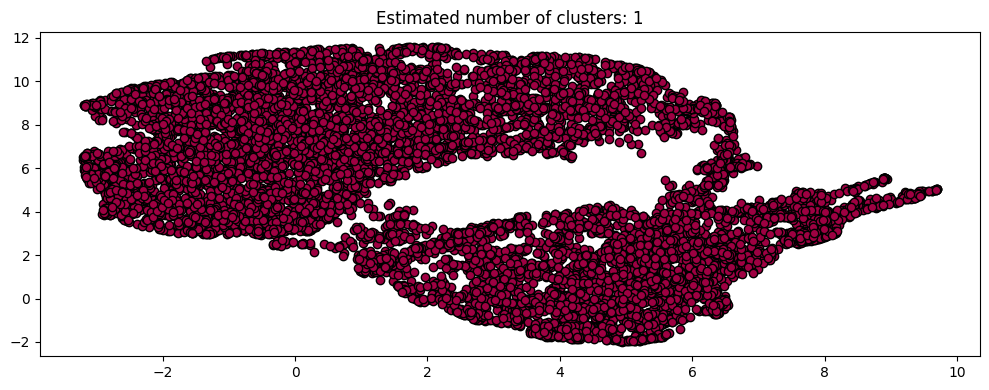

In [40]:
clustering = OPTICS(min_samples=best_params[0]).fit(all_st)
plot(X_reduced, clustering.labels_)  # предполагает

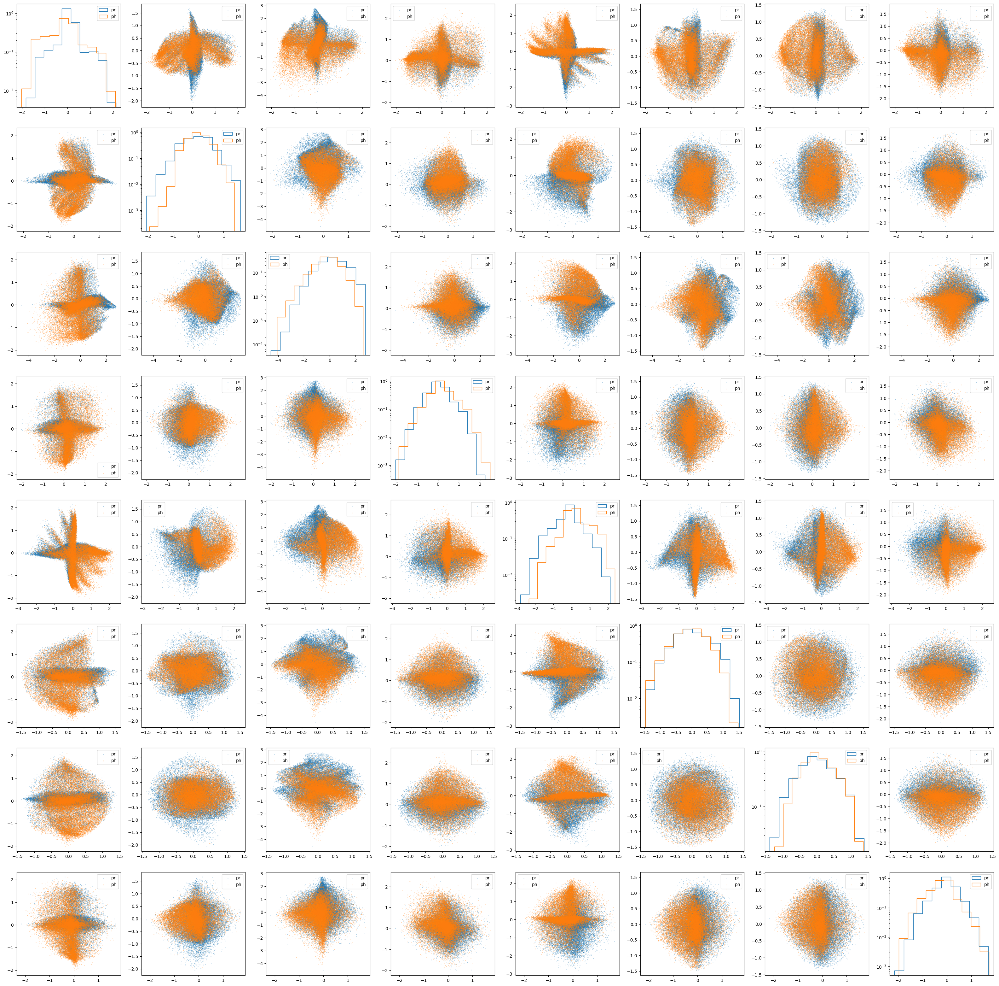

In [93]:
proton_st = all_emb['proton'][0][:25000]
photon_st = all_emb['photon'][0][:25000]

fig, axs = plt.subplots(8,8,figsize=(40,40))
for i in range(8):
    for j in range(8):
        if i == j:
            axs[i,i].hist(proton_st[:,i], histtype = 'step', log=True, label = 'pr', density=True)
            axs[i,i].hist(photon_st[:,i], histtype = 'step', log=True, label = 'ph', density=True)
            axs[i,i].legend()
        else:
            axs[i,j].scatter(proton_st[:,i], proton_st[:,j], s=0.5, alpha=0.3, label = 'pr')
            axs[i,j].scatter(photon_st[:,i], photon_st[:,j], s=0.5, alpha=0.3, label = 'ph')
            axs[i,j].legend()


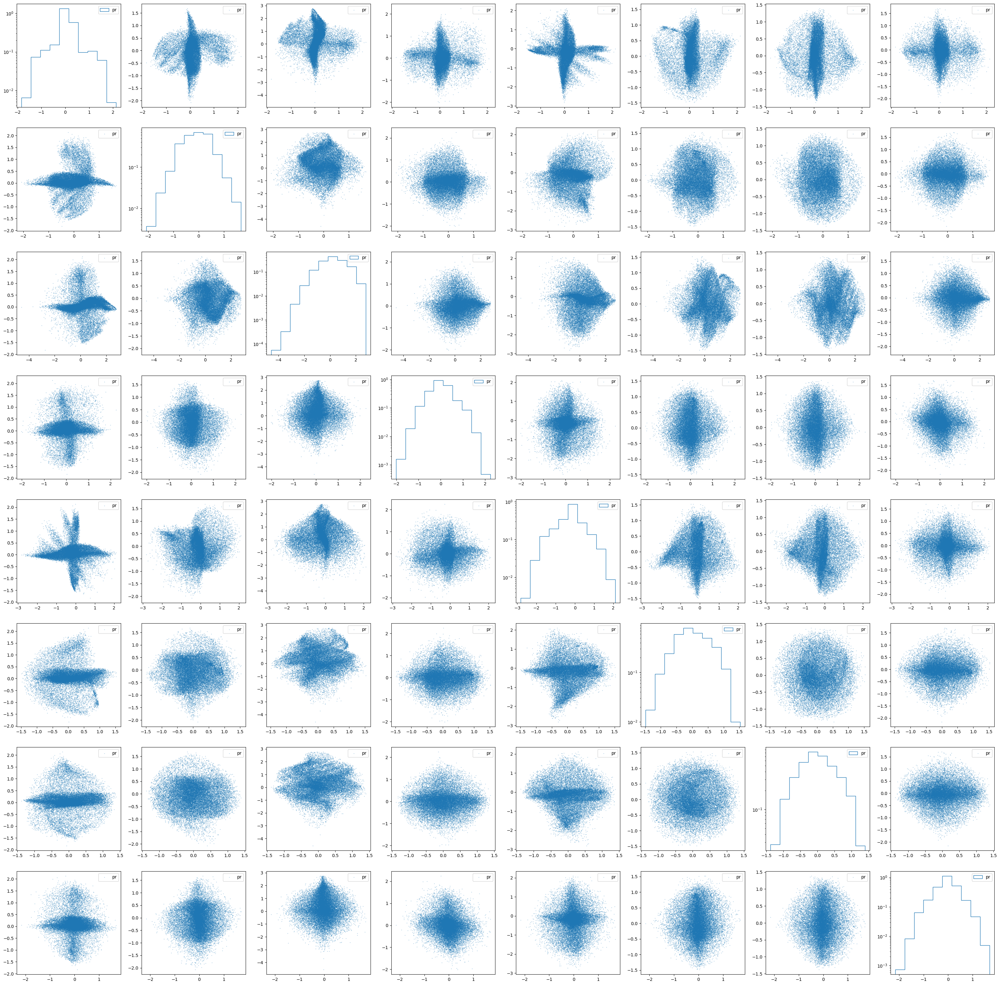

In [94]:
proton_st = all_emb['proton'][0][:25000]
photon_st = all_emb['photon'][0][:25000]

fig, axs = plt.subplots(8,8,figsize=(40,40))
for i in range(8):
    for j in range(8):
        if i == j:
            axs[i,i].hist(proton_st[:,i], histtype = 'step', log=True, label = 'pr', density=True)
            # axs[i,i].hist(photon_st[:,i], histtype = 'step', log=True, label = 'ph', density=True)
            axs[i,i].legend()
        else:
            axs[i,j].scatter(proton_st[:,i], proton_st[:,j], s=0.5, alpha=0.3, label = 'pr')
            # axs[i,j].scatter(photon_st[:,i], photon_st[:,j], s=0.5, alpha=0.3, label = 'ph')
            axs[i,j].legend()


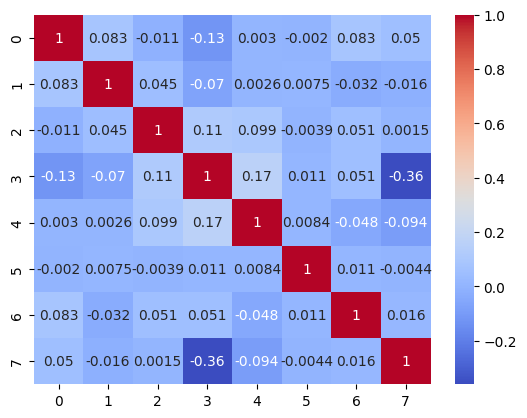

In [103]:
import seaborn as sns
corr = np.corrcoef(proton_st, rowvar=False)
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()



(25000,) (25000, 8)


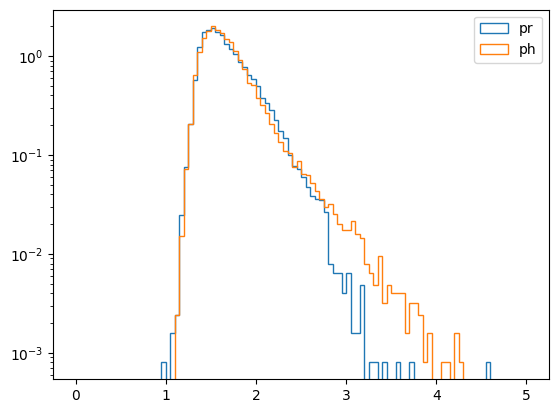

In [111]:
proton_st = all_emb['proton'][0][:25000]
photon_st = all_emb['photon'][0][:25000]

rad_pr = np.sqrt(np.sum(proton_st[:, :]**2, axis=1))
rad_ph = np.sqrt(np.sum(photon_st[:, :]**2, axis=1))
print(rad_pr.shape, proton_st.shape)
plt.hist(rad_pr, histtype = 'step', log=True, label = 'pr', density=True, range=(0, 5), bins=100)
plt.hist(rad_ph, histtype = 'step', log=True, label = 'ph', density=True, range=(0, 5), bins=100)
plt.legend()


(25000,) (25000, 8)


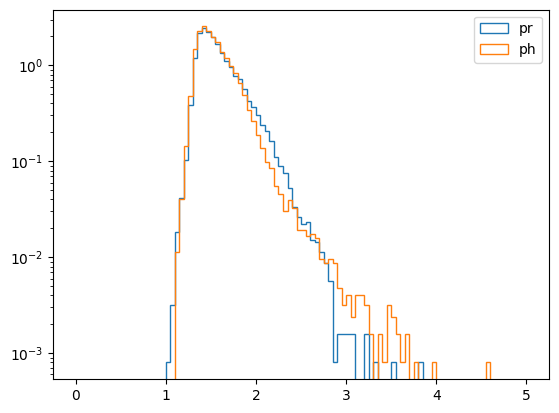

In [100]:
proton_st = all_emb['proton'][8][:25000]
photon_st = all_emb['photon'][8][:25000]

rad_pr = np.sqrt(np.sum(proton_st**2, axis=1))
rad_ph = np.sqrt(np.sum(photon_st**2, axis=1))
print(rad_pr.shape, proton_st.shape)
plt.hist(rad_pr, histtype = 'step', log=True, label = 'pr', density=True, range=(0, 5), bins=100)
plt.hist(rad_ph, histtype = 'step', log=True, label = 'ph', density=True, range=(0, 5), bins=100)
plt.legend()


# Analys like with Normal distribution(Aprior distribution)